# TP Machine Learning 2- ISE2 2025

## fait par: 
Bocar Mamoudou DIACK

# Todo
- Entraîner / optimiser 2 modèles ensemblistes
- Choisir le meilleur modèle parmi tous ceux qu'on a entraîné
- Étudier la feature importance global et local avec shap
- Optimiser si besoin le modèle et l'enregistrer au format .dill



## Summary

L'objectif est de construire un modèle de classification capable de **prédire si une personne gagne plus ou moins de 50 000 dollars par an**, en utilisant ses caractéristiques socio-démographiques.

Le jeu de données est **"Adult Income"** du [UCI Machine Learning Repository](https://archive.ics.uci.edu/).

- **[UCIMLREPO](https://github.com/uci-ml-repo/ucimlrepo) package**

Le package UCIMLRepo (pour **UCI Machine Learning Repository**) est une **bibliothèque Python** qui facilite l’accès aux jeux de données disponibles sur le célèbre dépôt [UCI Machine Learning Repository](https://archive.ics.uci.edu/). Il permet de **chercher, télécharger et utiliser facilement ces datasets directement dans un notebook Python**, sans avoir à passer par un téléchargement manuel.

In [ ]:


# pour python

!pip install numpy
!pip install matplotlib
!pip install pandas

# pour excel
!pip install openpyxl 

# pour machine learning

!pip install tensorflow
!pip install keras
!pip install jax
!pip install theano

#!pip install caffe
#!pip install pytorch
# Tensorflow, Pytorch, Keras, Theano, Caff, jax.



  Using cached Theano-1.0.5.tar.gz (2.8 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'


  error: subprocess-exited-with-error
  
  python setup.py egg_info did not run successfully.
  exit code: 1
  
  [15 lines of output]
  C:\Users\User\AppData\Local\Temp\pip-install-8iqvq1fj\theano_49bfa273071145b3940129875c39f8dd\versioneer.py:421: SyntaxWarning: invalid escape sequence '\s'
    LONG_VERSION_PY['git'] = '''
  Traceback (most recent call last):
    File "<string>", line 2, in <module>
    File "<pip-setuptools-caller>", line 34, in <module>
    File "C:\Users\User\AppData\Local\Temp\pip-install-8iqvq1fj\theano_49bfa273071145b3940129875c39f8dd\setup.py", line 74, in <module>
      version_data = versioneer.get_versions()
                     ^^^^^^^^^^^^^^^^^^^^^^^^^
    File "C:\Users\User\AppData\Local\Temp\pip-install-8iqvq1fj\theano_49bfa273071145b3940129875c39f8dd\versioneer.py", line 1412, in get_versions
      cfg = get_config_from_root(root)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^
    File "C:\Users\User\AppData\Local\Temp\pip-install-8iqvq1fj\theano_49bfa2730711

In [ ]:
pip install dill matplotlib missingno numpy pandas pendulum plotly seaborn imbalanced-learn loguru scikit-learn ucimlrepo yellowbrick


Note: you may need to restart the kernel to use updated packages.


## Packages

In [1]:
pip install dill imblearn pendulum ucimlrepo yellowbrick

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [75]:
from pathlib import Path

import dill
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import pendulum
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
from imblearn.pipeline import Pipeline as imb_Pipeline
from loguru import logger
from sklearn import set_config
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (confusion_matrix,
                             classification_report,
                             ConfusionMatrixDisplay,
                             roc_auc_score,
                             accuracy_score,
                             precision_score,
                             recall_score,
                             f1_score,
                             RocCurveDisplay,
                             PrecisionRecallDisplay,
                            )
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OrdinalEncoder, OneHotEncoder
from ucimlrepo import fetch_ucirepo, list_available_datasets
from yellowbrick.classifier import DiscriminationThreshold

set_config(display='diagram')
pd.set_option("display.max_columns", None)

## Settings

In [76]:
EXECUTION_DATE = pendulum.now(tz="UTC")


ROOT_DIR = Path().cwd()
MODEL_DIR = Path(ROOT_DIR, "models")

MODEL_DIR.mkdir(parents=True, exist_ok=True)
logger.info(f"Model directory: {MODEL_DIR}")

2025-05-04 13:28:07.016 | INFO     | __main__:<module>:8 - Model directory: c:\Users\BOCAR DIACK\Desktop\BMD ISE2\ISE2_2024-2025\SEMESTRE 2\ML2\TP\models


## Data collection

In [77]:
# check which datasets can be imported
list_available_datasets() 
# La liste de tous les dataset

-------------------------------------
The following datasets are available:
-------------------------------------
Dataset Name                                                                            ID    
------------                                                                            --    
Abalone                                                                                 1     
Adult                                                                                   2     
Annealing                                                                               3     
Audiology (Standardized)                                                                8     
Auto MPG                                                                                9     
Automobile                                                                              10    
Balance Scale                                                                           12    
Balloons                       

In [78]:
# fetch dataset 
adult = fetch_ucirepo(name="Adult", id=None) 

# fetch data
data = adult.data.original

logger.info(f"{data.shape}")

2025-05-04 13:30:14.962 | INFO     | __main__:<module>:7 - (48842, 15)


In [82]:
data.head() 

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [83]:
# metadata 
logger.info(f"Metadata \n {adult.metadata}") 
  
# variable information 
logger.info(f"Features: \n{adult.variables}") 

2025-05-04 13:34:26.728 | INFO     | __main__:<module>:2 - Metadata 
 {'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'intro_paper': None, 'additional_info': {'summary': "Extraction was done by Barry Becker from the 1994 Census da

In [84]:
data.describe(include="all")

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
count,48842.000000,47879,4.884200e+04,48842,48842.000000,48842,47876,48842,48842,48842,48842.000000,48842.000000,48842.000000,48568,48842
unique,NaN,9,NaN,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,4
top,NaN,Private,NaN,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,33906,NaN,15784,NaN,22379,6172,19716,41762,32650,NaN,NaN,NaN,43832,24720
mean,38.643585,NaN,1.896641e+05,NaN,10.078089,NaN,NaN,NaN,NaN,NaN,1079.067626,87.502314,40.422382,NaN,NaN
std,13.710510,NaN,1.056040e+05,NaN,2.570973,NaN,NaN,NaN,NaN,NaN,7452.019058,403.004552,12.391444,NaN,NaN
min,17.000000,NaN,1.228500e+04,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN
25%,28.000000,NaN,1.175505e+05,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
50%,37.000000,NaN,1.781445e+05,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
75%,48.000000,NaN,2.376420e+05,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,NaN


In [85]:
data.columns = data.columns.str.replace("-", "_")
data.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital_status', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country',
       'income'],
      dtype='object')

In [86]:
data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       47879 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education_num   48842 non-null  int64 
 5   marital_status  48842 non-null  object
 6   occupation      47876 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital_gain    48842 non-null  int64 
 11  capital_loss    48842 non-null  int64 
 12  hours_per_week  48842 non-null  int64 
 13  native_country  48568 non-null  object
 14  income          48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


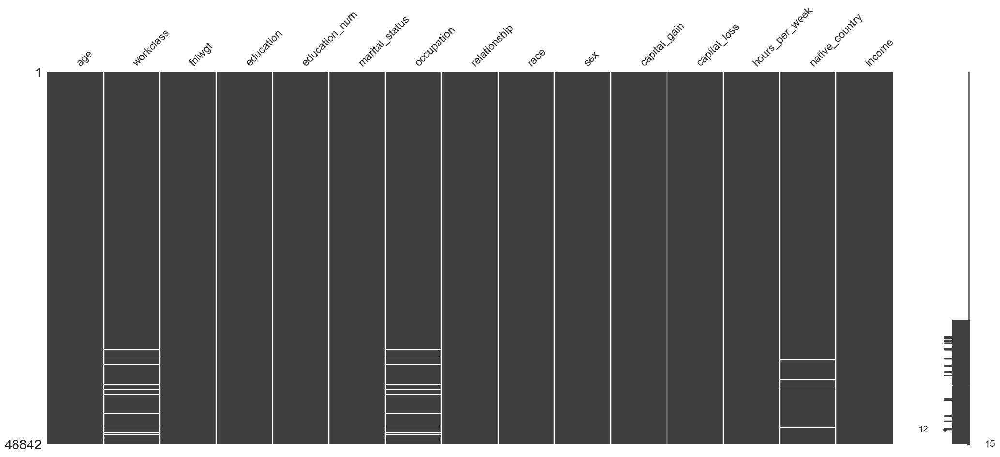

In [11]:
msno.matrix(data); 

## EDA: Exploratory Data Analysis

In [87]:
data["income"].value_counts(normalize=False)

income
<=50K     24720
<=50K.    12435
>50K       7841
>50K.      3846
Name: count, dtype: int64

### Target

In [89]:
data = data.assign(income= lambda dfr: dfr.income.str.replace(".", ""))

In [90]:
label_distribution = data.groupby(['income']).size().reset_index(name='count')
label_distribution

,income,count
0,<=50K,37155
1,>50K,11687


In [91]:
# Plot a pie chart with custom colors for income
fig = px.pie(
    label_distribution, 
    names='income',  # Use 'income' for pie segments
    values='count',  # Use 'count' for the size of each pie slice
    # color='income',  # Color the segments based on income
    title='Income distribution',
    labels={'income': 'Income', 'count': 'Count'},
)

fig.update_traces(textinfo='percent+label')  # Display percentage and labels on the pie chart

fig.show()

### Categorical features

In [92]:
categorical_columns = data.select_dtypes(include="object").columns

categorical_columns

Index(['workclass', 'education', 'marital_status', 'occupation',
       'relationship', 'race', 'sex', 'native_country', 'income'],
      dtype='object')

In [97]:
for col_name in categorical_columns:
    logger.info(f"{col_name} ==============\n {data[col_name].value_counts(dropna=False)}\n")

2025-05-04 13:38:56.305 | INFO     | __main__:<module>:2 - workclass ==============
 workclass
Private             33906
Self-emp-not-inc     3862
Local-gov            3136
State-gov            1981
None                 1836
Self-emp-inc         1695
Federal-gov          1432
NaN                   963
Without-pay            21
Never-worked           10
Name: count, dtype: int64

2025-05-04 13:38:56.309 | INFO     | __main__:<module>:2 - education ==============
 education
HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: count, dtype: int64

2025-05-04 13:38:56.315 | INFO     | __main__:<module>:2 - marital_status ==============
 marital_status
Married-civ-spouse       22379
Never-ma

#### Preprocessing

In [96]:
# Replace “?” with None for all columns containing it
data.replace("?", None, inplace=True) 

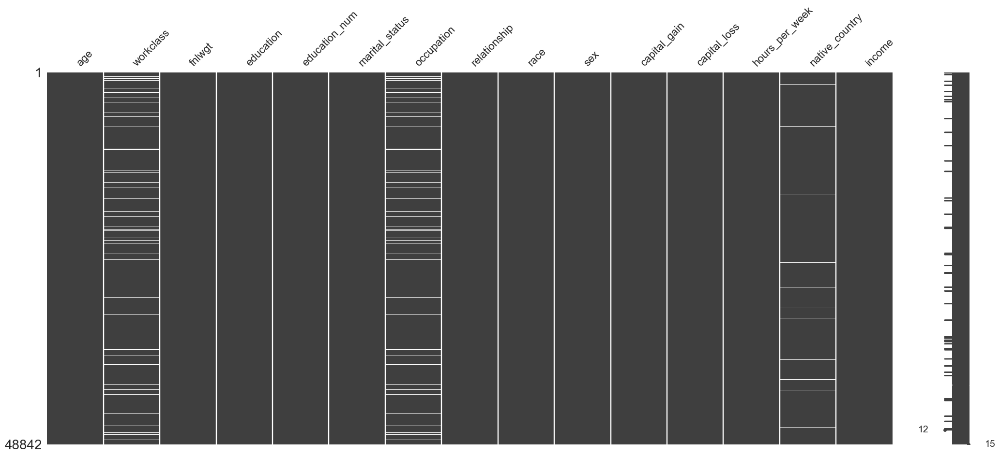

In [95]:
msno.matrix(data);

### Remove Duplicated

In [22]:
# Shape after deduplication
data.shape

(48842, 15)

In [98]:
# Check for the duplicates: if True then there are duplicated
data.duplicated().any()

np.True_

In [99]:
data[data.duplicated(keep=False)].sort_values(["workclass", "education", "relationship"])

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
24667,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
36713,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
5842,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
22300,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38993,22,NaN,334593,Some-college,10,Never-married,NaN,Not-in-family,White,Male,0,0,40,United-States,<=50K
10094,19,None,167428,Some-college,10,Never-married,None,Own-child,White,Male,0,0,40,United-States,<=50K
30384,20,None,203353,Some-college,10,Never-married,None,Own-child,White,Female,0,0,40,United-States,<=50K
34424,20,NaN,203353,Some-college,10,Never-married,NaN,Own-child,White,Female,0,0,40,United-States,<=50K


In [100]:
# Drop duplicates
data = data.drop_duplicates(keep='first', inplace=False)
data.shape

(48790, 15)

In [101]:
# Shape after deduplication
data.shape

(48790, 15)

### Numerical features

In [102]:
data["capital_diff"] = data['capital_gain'] - data['capital_loss']

In [103]:
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

In [104]:
# Initialize a figure
fig = go.Figure()

# Iterate over numeric columns in the DataFrame
for column in numeric_columns:
    fig.add_trace(go.Box(
        y=data[column],
        name=column,
        marker=dict(color='skyblue')
    ))

# Update layout with a title and axis labels
fig.update_layout(
    title='Distribution of Numeric Columns without Outliers',
    yaxis_title='Values',
    xaxis_title='Numeric Columns'
)

# Show the figure
fig.show()


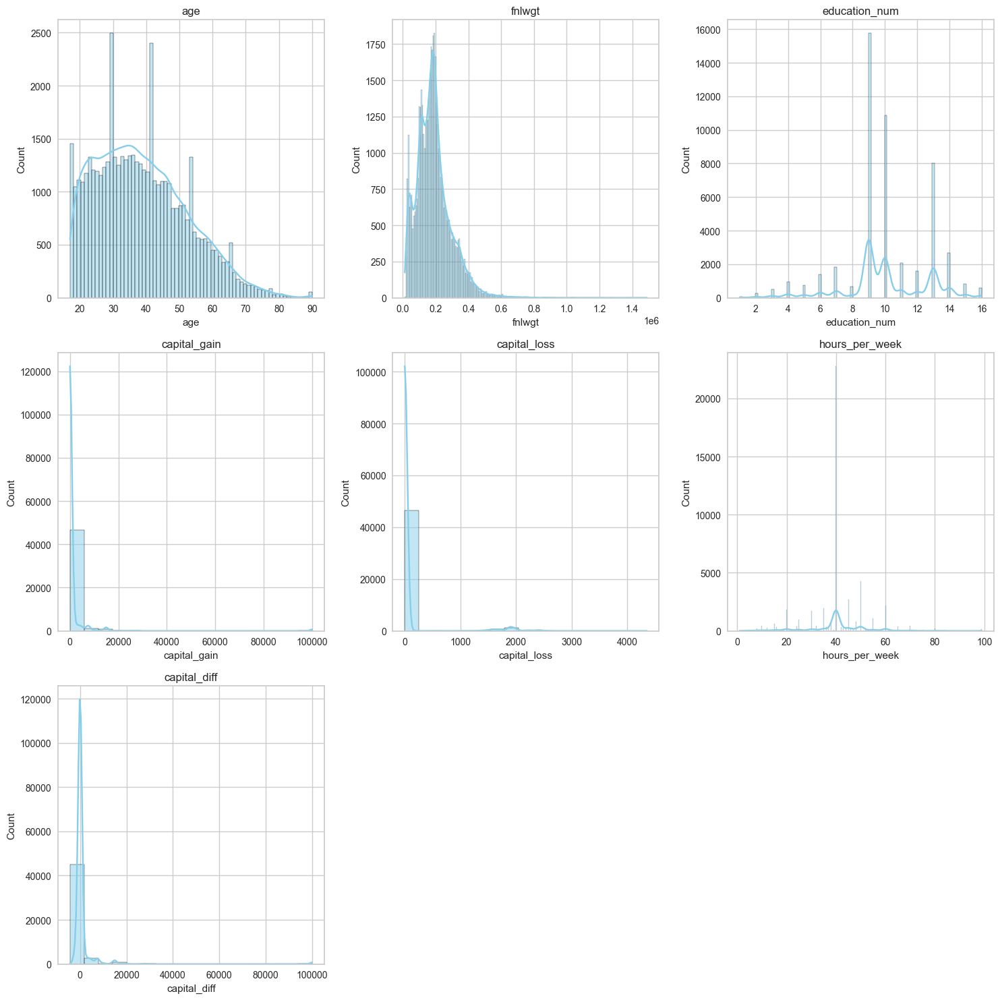

In [105]:
n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col_name in enumerate(numeric_columns):
    sns.histplot(data[col_name], kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(col_name)
    
for i in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Bivariate analysis

In [106]:
px.box(
    data,
    x='income',  # Income category on the x-axis
    y='age',  # Age distribution on the y-axis
    title='Age Distribution by Income',
    labels={'income': 'Income Category', 'age': 'Age'}
)

In [107]:
data

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K,0
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States,<=50K,0
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K,0
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K,5455


In [108]:
for col_name in ["workclass",
                 "education",
                 "marital_status",
                 "sex"
                ]:

    feature_income_counts = data.groupby([col_name, 'income']).size().unstack()
    
    fig = px.bar(feature_income_counts,
                 barmode='stack',  # Stack bars for income categories
                 title=f'Relationship between Income and {col_name}',
                 labels={'value': 'Count'}
                )
    fig.show()

In [109]:
for col_name in numeric_columns:

    #counts
    num_feat_income_counts = data.groupby([col_name, "income"]).size().unstack()
    
    # Plot using iplot
    fig = px.area(num_feat_income_counts,
                  title=f"Relationship between {col_name} and income",
                  labels={"value": "Count"}
                 )
    fig.show()

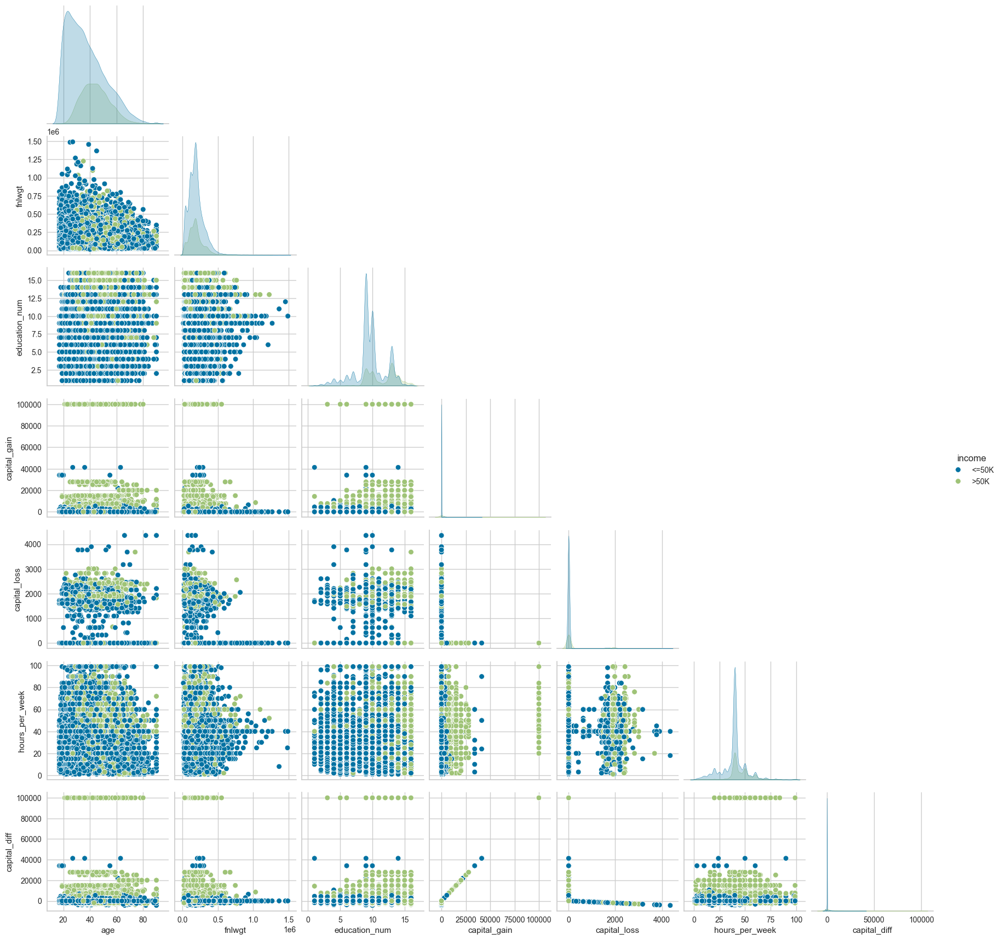

In [110]:
sns.pairplot(data, hue="income", corner=True);

### Correlation

In [111]:
corr_matrix = data.loc[:, numeric_columns].corr()


In [112]:
data.loc[:, numeric_columns].corr()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,capital_diff
age,1.000000,-0.076451,0.030635,0.077185,0.056838,0.071223,0.073878
fnlwgt,-0.076451,1.000000,-0.038727,-0.003715,-0.004378,-0.013521,-0.003467
education_num,0.030635,-0.038727,1.000000,0.125219,0.080986,0.143915,0.120459
capital_gain,0.077185,-0.003715,0.125219,1.000000,-0.031475,0.082152,0.998547
capital_loss,0.056838,-0.004378,0.080986,-0.031475,1.000000,0.054431,-0.085285
hours_per_week,0.071223,-0.013521,0.143915,0.082152,0.054431,1.000000,0.078959
capital_diff,0.073878,-0.003467,0.120459,0.998547,-0.085285,0.078959,1.000000


<Axes: >

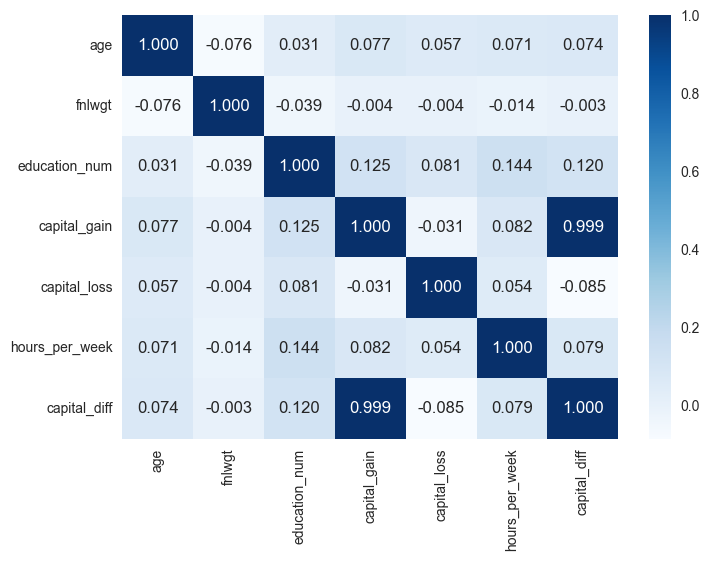

In [113]:
sns.heatmap(corr_matrix, annot=True, fmt=".3f", cmap="Blues")

## Data preparation

In [114]:
data.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0


In [115]:
# Removing rows where 'Workclass' is 'Without-pay' and 'Never-worked'
data = data[~data["workclass"].str.lower().isin(["without-pay", "never-worked"])
            # & data["hours_per_week"].between(20, 60)
           ]
data.shape

(48759, 16)

In [116]:
data["hours_per_week"].value_counts(sort=False).sort_index()

hours_per_week
1      27
2      53
3      59
4      83
5      95
     ... 
95      2
96      9
97      2
98     14
99    137
Name: count, Length: 96, dtype: int64

In [121]:
#Feature mapping
workclass_mapping = {
    'Private': 'Private',
    'Self-emp-not-inc': 'Self-Employed',
    'Local-gov': 'Government',
    'State-gov': 'Government',
    'Self-emp-inc': 'Self-Employed',
    'Federal-gov': 'Government',
    'Without-pay': 'Other',
    'Never-worked': 'Other'
}

marital_status_mapping = {
    "Married-civ-spouse": "Married",
    "Married-spouse-absent": "Married",
    "Married-AF-spouse": "Married",
    "Separated": "Married",
    "Never-married": "Single",
    "Divorced": "Single",
    "Widowed": "Single"
}

relationship_mapping = {
    'Husband': 'spouse',
    'Not-in-family': 'Others:',
    'Own-child': 'Immediate Family',
    'Unmarried': 'Others:',
    'Wife': 'spouse',
    'Other-relative': 'Immediate Family',
}

# occupation
# occupation_mapping = to be defined if necessary

In [127]:
data = data.assign(income=lambda dfr: dfr['income'].map({"<=50K": 0, ">50K": 1}),
                   # capital_diff_bin = lambda dfr: pd.cut(dfr['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
                   native_country=lambda dfr: dfr["native_country"].fillna("United-States").map(lambda val: val if val == "United-States" else "Others"),
                   education=lambda dfr: dfr.education.replace(["11th", "9th", "7th-8th", "5th-6th", "10th", "1st-4th", "12th"], "School"),
                   race=lambda dfr: dfr.race.map(lambda val: 'White' if val == 'White' else 'Others'),
                   # workclass=lambda dfr: dfr.workclass.map(workclass_mapping),
                   # marital_status=lambda dfr: dfr.marital_status.map(marital_status_mapping),
                   # relationship=lambda dfr: dfr.relationship.map(relationship_mapping),
                  )

## Train / test split

In [ ]:
data.drop(['capital_gain',
           'capital_loss',
            'capital_diff',
           "fnlwgt",  # fnlwgt (Final Weight): Represents the weight assigned to each individual.
           "education_num",
       ], axis=1, inplace=True)
      

KeyError: "['capital_gain', 'capital_loss', 'capital_diff', 'fnlwgt', 'education_num'] not found in axis"

In [131]:
x_values = data.drop(columns=['income'])  
y_target = data.income

In [132]:
x_train, x_test, y_train, y_test = train_test_split(x_values, y_target, test_size=0.2, random_state=42, stratify=y_target)

ValueError: Input y contains NaN.

In [74]:
# dans la cellule ci haut, on a separé les données selon la variable cible

In [133]:
x_train.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country
44101,35,Local-gov,Bachelors,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,48,United-States
36845,61,Private,HS-grad,Divorced,Machine-op-inspct,Not-in-family,White,Female,0,0,40,United-States
44706,41,Private,Some-college,Divorced,Sales,Unmarried,White,Male,0,0,46,United-States
35127,49,Self-emp-not-inc,School,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States
41678,37,Self-emp-not-inc,Assoc-voc,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,60,United-States


In [134]:
y_train.value_counts(normalize=True).mul(100).round(2)

income
0    76.05
1    23.95
Name: proportion, dtype: float64

In [135]:
y_train.value_counts(normalize=True).mul(100).round(2)

income
0    76.05
1    23.95
Name: proportion, dtype: float64

### Feature engineering

In [136]:
x_values.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,hours_per_week,native_country
0,39,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,40,United-States
1,50,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,13,United-States
2,38,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States
3,53,Private,School,Married-civ-spouse,Handlers-cleaners,Husband,Others,Male,40,United-States
4,28,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Others,Female,40,Others


In [137]:
# numerical
numeric_features = x_values.select_dtypes(include="number").columns

# categorical
onehot_features = ['workclass', 'occupation', 'relationship', 'race', 'sex', 'marital_status']

country_feature = ["native_country"]
ordinal_features = ['education',
                   # 'capital_diff_bin',
                  ]
    
cat_for_edu = ['Preschool', 'School', 'HS-grad','Some-college', 'Assoc-voc', 'Assoc-acdm','Bachelors', 'Masters', 'Prof-school', 'Doctorate']
cat_for_capdiff = ['Low', 'High']

In [138]:
x_train.loc[:, numeric_features]

,age,hours_per_week
44101,35,48
36845,61,40
44706,41,46
35127,49,50
41678,37,60
...,...,...
2324,63,50
30520,21,40
42196,60,25
41858,34,40


In [139]:
x_train.loc[:, numeric_features]

,age,hours_per_week
44101,35,48
36845,61,40
44706,41,46
35127,49,50
41678,37,60
...,...,...
2324,63,50
30520,21,40
42196,60,25
41858,34,40


In [140]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])


# Education : ordinal + imputation 'undefined' gérée via catégorie manquante
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('ordinal', OrdinalEncoder(categories=[cat_for_edu + ['undefined']], handle_unknown='use_encoded_value', unknown_value=-1))
])

# OneHot : autres variables catégorielles avec imputation "undefined"
onehot_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Native country : imputation avec "United-States"
country_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='United-States')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Pipeline
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features),
    ('ord', ordinal_transformer, ordinal_features),
    ('cat', onehot_transformer, onehot_features),
    ('country', country_transformer, country_feature)
])



preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 Index(['age', 'hours_per_week'], dtype='object')),
                                ('ord',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='undefined',
                                                                strategy='constant')),
                                                 ('ordinal',
                                                  OrdinalEncoder(categories=[['Preschool',
                                                                              'School',
                                                                              'HS-grad',
                                                                              'Some-col...
                                                  SimpleImputer(fill_value='undefined',
                                                                strategy='constant')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['workclass', 'occupation', 'relationship',
                                  'race', 'sex', 'marital_status']),
                                ('country',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='United-States',
                                                                strategy='constant')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['native_country'])])

## Modeling

#### Dummy regressor

In [141]:
# Pipeline
dm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', DummyClassifier())
])

dm_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(categories=[['Prescho...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', DummyClassifier())])

In [142]:
# Training
dm_pipeline.fit(x_train, y_train)

# Predictions & evaluation
dm_y_pred_test = dm_pipeline.predict(x_test)
dm_y_proba_test = dm_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, dm_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, dm_y_pred_test)}")

2025-05-04 14:15:44.187 | INFO     | __main__:<module>:9 - AUC: 0.50
c:\Users\BOCAR DIACK\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\BOCAR DIACK\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\BOCAR DIACK\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

2025-05-04 14:15:44.209 | INFO     | __main__:<module>:11 - Classification r

#### Logistic regression

In [143]:
# Pipeline
rl_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', LogisticRegression(max_iter=1000))
])

rl_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'hours_per_week'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder(categories=[['Prescho...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', LogisticRegression(max_iter=1000))])

##### Baseline

In [144]:
# 8. Entraînement
rl_pipeline.fit(x_train, y_train)

# 9. Prédictions & évaluation
rl_y_pred_test = rl_pipeline.predict(x_test)
rl_y_proba_test = rl_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, rl_y_proba_test):.2f} ")

logger.info(f"Classification report: \n{classification_report(y_test, rl_y_pred_test)}")

2025-05-04 14:15:54.042 | INFO     | __main__:<module>:9 - AUC: 0.88 
2025-05-04 14:15:54.066 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.87      0.92      0.89      7416
           1       0.69      0.56      0.62      2336

    accuracy                           0.83      9752
   macro avg       0.78      0.74      0.76      9752
weighted avg       0.83      0.83      0.83      9752



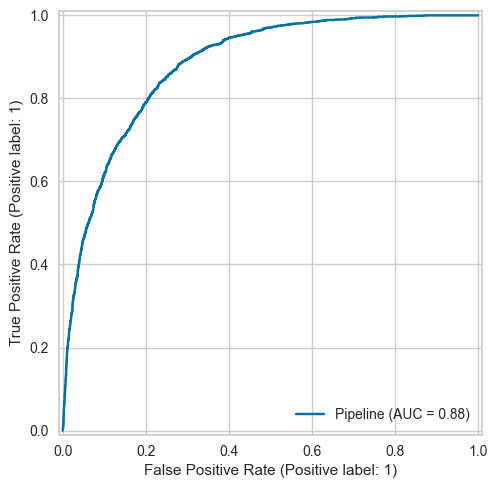

In [145]:
RocCurveDisplay.from_estimator(rl_pipeline, x_test, y_test);

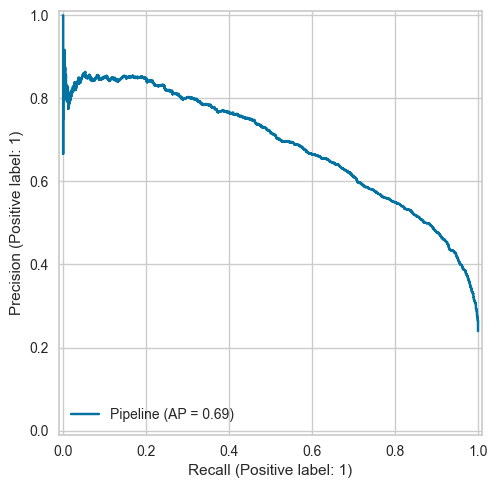

In [146]:
PrecisionRecallDisplay.from_estimator(rl_pipeline, x_test, y_test);


##### Tuning hyperparameters

In [147]:
rl_param_grid = {
    "clf__penalty": ["l2"],  # 'l1' si solver = 'liblinear' ou 'saga'
    "clf__C": [0.01, 0.1, 1, 2, 3, 5, 10],
    "clf__solver": ['liblinear', 'lbfgs', "sag", "saga"],  # lbfgs ne supporte que l2
    "clf__class_weight": ['balanced', None],
}

In [148]:
# Cross-validation
cv = StratifiedKFold(n_splits=5) 

rl_grid_search = GridSearchCV(rl_pipeline, rl_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)

# Training
rl_grid_search.fit(x_train, y_train)

# Best params
logger.info(f"Best params : {rl_grid_search.best_params_}")

# Evaluation
rl_y_pred_test_opt = rl_grid_search.predict(x_test)
rl_y_proba_test_opt  = rl_grid_search.predict_proba(x_test)[:, 1]

logger.info(f"AUC : {roc_auc_score(y_test, rl_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, rl_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, rl_y_pred_test_opt):.2f}")


2025-05-04 14:22:30.278 | INFO     | __main__:<module>:10 - Best params : {'clf__C': 2, 'clf__class_weight': 'balanced', 'clf__penalty': 'l2', 'clf__solver': 'lbfgs'}
2025-05-04 14:22:30.379 | INFO     | __main__:<module>:16 - AUC : 0.88
2025-05-04 14:22:30.385 | INFO     | __main__:<module>:17 - F1-score : 0.65
2025-05-04 14:22:30.387 | INFO     | __main__:<module>:18 - Accuracy : 0.78


##### Discrimination threshold

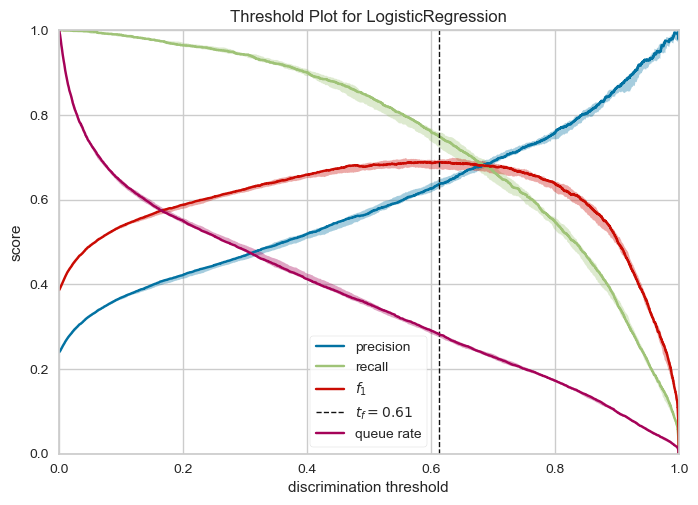

In [ ]:
viz = DiscriminationThreshold(rl_grid_search.best_estimator_, random_state=42, fbeta=1.0, cv=cv, argmax="fscore")

# Fit et plot
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show();

In [149]:
data_lift = pd.DataFrame({"y_true": y_test, "y_pred": rl_y_pred_test_opt, "proba": rl_y_proba_test_opt})
data_lift = data_lift.sort_values("proba", ascending=False).reset_index(drop=True)
data_lift.head()

,y_true,y_pred,proba
0,1,1,0.995268
1,1,1,0.994041
2,0,1,0.993091
3,1,1,0.993007
4,1,1,0.992929


In [150]:

data_lift["decile"] = pd.qcut(data_lift.index, 10, labels=False)
data_lift.head()

,y_true,y_pred,proba,decile
0,1,1,0.995268,0
1,1,1,0.994041,0
2,0,1,0.993091,0
3,1,1,0.993007,0
4,1,1,0.992929,0


In [151]:
# Global positive rate
global_positive_rate =  data_lift["y_true"].sum() / len(data_lift)
global_positive_rate

np.float64(0.23954060705496308)

In [152]:
lift_aggregate_table = data_lift.groupby("decile")["y_true"].agg(["sum", "count"])

In [153]:
lift_aggregate_table["cum_positives"] = lift_aggregate_table["sum"].cumsum()

lift_aggregate_table["positive_rate_cum"] = lift_aggregate_table["cum_positives"] / lift_aggregate_table["count"].cumsum()
lift_aggregate_table["lift_score"] = lift_aggregate_table["positive_rate_cum"] / global_positive_rate

In [154]:
lift_aggregate_table["percent_sample"] = 10 * (lift_aggregate_table.index + 1)

lift_aggregate_table
px.line(
    lift_aggregate_table,
    x="percent_sample",
    y="lift_score",
    labels={
        "percent_sample": "Cumulative % of Sample",
        "lift_score": "Lift Score"
    },
    title="Lift Curve"
)

In [155]:
print(classification_report(y_test,rl_y_pred_test_opt)) 

              precision    recall  f1-score   support

           0       0.94      0.77      0.84      7416
           1       0.53      0.84      0.65      2336

    accuracy                           0.78      9752
   macro avg       0.73      0.80      0.75      9752
weighted avg       0.84      0.78      0.80      9752



In [ ]:
# Nouveau seuil
threshold = 0.61

# Nouvelle prédiction basée sur le seuil
y_pred_threshold_061 = (data_lift["proba"] >= threshold).astype(int)


In [ ]:
y_pred_threshold_061

0       1
1       1
2       1
3       1
4       1
       ..
9747    0
9748    0
9749    0
9750    0
9751    0
Name: proba, Length: 9752, dtype: int32

In [156]:
# Evaluation avec seuil 0.61
rl_y_proba_test_opt = rl_grid_search.predict_proba(x_test)[:, 1]
rl_y_pred_test_opt = (rl_y_proba_test_opt >= 0.61).astype(int)

logger.info(f"AUC : {roc_auc_score(y_test, rl_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, rl_y_pred_test_opt):.2f}")
logger.info(f"Accuracy : {accuracy_score(y_test, rl_y_pred_test_opt):.2f}")

2025-05-04 14:38:45.063 | INFO     | __main__:<module>:5 - AUC : 0.88
2025-05-04 14:38:45.074 | INFO     | __main__:<module>:6 - F1-score : 0.65
2025-05-04 14:38:45.078 | INFO     | __main__:<module>:7 - Accuracy : 0.81


##### Model analysis

In [ ]:
# features importances

##### Save model

In [157]:
# Save model

model_path_name = Path(MODEL_DIR, "best_logistic_model.dill")

logger.info(f"Model path name: {model_path_name}")
with open(model_path_name, "wb") as fp:
    dill.dump(rl_grid_search.best_estimator_, fp)

2025-05-04 14:38:51.722 | INFO     | __main__:<module>:5 - Model path name: c:\Users\BOCAR DIACK\Desktop\BMD ISE2\ISE2_2024-2025\SEMESTRE 2\ML2\TP\models\best_logistic_model.dill


### KNN

#### Baseline

In [ ]:
# Pipeline
knn_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', KNeighborsClassifier(n_neighbors=10))
])

knn_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['age', 'capital_gain', 'capital_loss', 'hours_per_week'], dtype='object')),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='undefined',
                                                                                 strategy='constant')),
                                                                  ('ordinal',
                                                                   Ordina...
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['workclass', 'occupation',
                                                   'relationship', 'race',
                                                   'sex', 'marital_status']),
                                                 ('country',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='United-States',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['native_country'])])),
                ('clf', KNeighborsClassifier(n_neighbors=10))])

In [ ]:
# 8. Entraînement
knn_pipeline.fit(x_train, y_train)

# 9. Prédictions & évaluation
knn_y_pred_test = knn_pipeline.predict(x_test)
knn_y_proba_test = knn_pipeline.predict_proba(x_test)[:, 1]


logger.info(f"AUC: {roc_auc_score(y_test, knn_y_proba_test):.2f}")

logger.info(f"Classification report: \n{classification_report(y_test, knn_y_pred_test)}")

2025-04-28 18:19:39.017 | INFO     | __main__:<module>:9 - AUC: 0.89
2025-04-28 18:19:39.069 | INFO     | __main__:<module>:11 - Classification report: 
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      7416
           1       0.73      0.57      0.64      2336

    accuracy                           0.85      9752
   macro avg       0.80      0.75      0.77      9752
weighted avg       0.84      0.85      0.84      9752



In [ ]:
class_names = knn_pipeline.classes_
class_names

array([0, 1], dtype=int64)

In [158]:
ConfusionMatrixDisplay.from_estimator(knn_pipeline, x_test, y_test,
                                      display_labels=class_names,
                                      normalize="true", cmap=plt.cm.Blues);

NameError: name 'knn_pipeline' is not defined

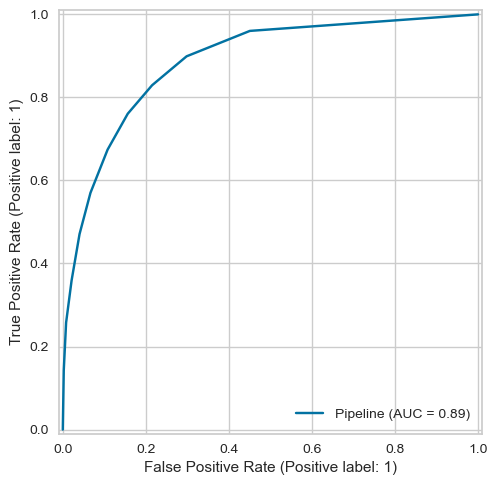

In [ ]:
RocCurveDisplay.from_estimator(knn_pipeline, x_test, y_test);

In [ ]:
knn_param_grid = {
	"clf__n_neighbors":[5, 10, 15, 20, 30],
	"clf__weights": ['uniform', 'distance']
}

In [ ]:
knn_grid_search = GridSearchCV(knn_pipeline, knn_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)

# Training
knn_grid_search.fit(x_train, y_train)


C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1102: UserWarning:

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan]



GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=91, shuffle=False),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['age', 'capital_gain', 'capital_loss', 'hours_per_week'], dtype='object')),
                                                                        ('ord',
                                                                         Pipeline(steps=[('i...
                                                                          'marital_status']),
                                                                        ('country',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='United-States',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['native_country'])])),
                                       ('clf',
                                        KNeighborsClassifier(n_neighbors=10))]),
             n_jobs=-1,
             param_grid={'clf__n_neighbors': [5, 10, 15, 20, 30],
                         'clf__weights': ['uniform', 'distance']},
             scoring='roc_auc')

In [ ]:
best_treshold = 0.61

In [ ]:
# Best params
logger.info(f"Best params : \n{knn_grid_search.best_params_}")

# Evaluation
knn_y_proba_test_opt = knn_grid_search.predict_proba(x_test)[:, 1] 
knn_y_pred_test_opt = (knn_y_proba_test_opt >= best_treshold).astype(int)

logger.info(f"AUC : {roc_auc_score(y_test, knn_y_proba_test_opt):.2f}")
logger.info(f"F1-score : {f1_score(y_test, knn_y_pred_test_opt):.2f}")


2025-04-28 19:00:32.963 | INFO     | __main__:<module>:2 - Best params : 
{'clf__n_neighbors': 5, 'clf__weights': 'uniform'}
2025-04-28 19:00:57.283 | INFO     | __main__:<module>:8 - AUC : 0.86
2025-04-28 19:00:57.354 | INFO     | __main__:<module>:9 - F1-score : 0.56


# Travail Pratique - Classification des Revenus (Ceci constitue la suite du TP et le travil demandé)

## 1. Préparation des données
## Chargement des données

In [ ]:
from ucimlrepo import fetch_ucirepo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
import shap
import dill



### Préprocessing

In [172]:
# Identification des colonnes numériques et catégorielles
num_cols = x_train.select_dtypes(include=['int64', 'float64']).columns
cat_cols = x_train.select_dtypes(include=['object']).columns

# Pipeline de prétraitement
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer([
    ('num', num_pipeline, num_cols),
    ('cat', cat_pipeline, cat_cols)
])

# Application du prétraitement
X_train_preprocessed = preprocessor.fit_transform(x_train)
X_test_preprocessed = preprocessor.transform(x_test)

## 2. Entraînement et optimisation des modèles ensemblistes
### Random Forest

In [176]:
# Initialisation du modèle
rf = RandomForestClassifier(random_state=42)

# Grille de paramètres pour l'optimisation
rf_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Recherche par grille
rf_grid = GridSearchCV(rf, rf_param_grid, cv=5, scoring='roc_auc', n_jobs=-1, verbose=1)
rf_grid.fit(X_train_preprocessed, y_train)

# Meilleurs paramètres
print("Meilleurs paramètres Random Forest:", rf_grid.best_params_)
print("Meilleur score Random Forest:", rf_grid.best_score_)

# Évaluation sur le test set
rf_best = rf_grid.best_estimator_
y_pred_rf = rf_best.predict(X_test_preprocessed)
y_proba_rf = rf_best.predict_proba(X_test_preprocessed)[:, 1]

print("Random Forest - Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Random Forest - ROC AUC:", roc_auc_score(y_test, y_proba_rf))
print("Random Forest - Classification Report:\n", classification_report(y_test, y_pred_rf))

Fitting 5 folds for each of 24 candidates, totalling 120 fits
Meilleurs paramètres Random Forest: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Meilleur score Random Forest: 0.9182049459615547
Random Forest - Accuracy: 0.8658736669401148
Random Forest - ROC AUC: 0.9171022818581815
Random Forest - Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.94      0.91      7416
           1       0.77      0.63      0.69      2336

    accuracy                           0.87      9752
   macro avg       0.83      0.78      0.80      9752
weighted avg       0.86      0.87      0.86      9752



### Gradient Boosting

In [175]:
# Initialisation du modèle
gb = GradientBoostingClassifier(random_state=42)

# Grille de paramètres pour l'optimisation
gb_param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_samples_split': [2, 5]
}

# Recherche par grille
gb_grid = GridSearchCV(gb, gb_param_grid, cv=5, scoring='roc_auc', n_jobs=-1, verbose=1)
gb_grid.fit(X_train_preprocessed, y_train)

# Meilleurs paramètres
print("Meilleurs paramètres Gradient Boosting:", gb_grid.best_params_)
print("Meilleur score Gradient Boosting:", gb_grid.best_score_)

# Évaluation sur le test set
gb_best = gb_grid.best_estimator_
y_pred_gb = gb_best.predict(X_test_preprocessed)
y_proba_gb = gb_best.predict_proba(X_test_preprocessed)[:, 1]

print("Gradient Boosting - Accuracy:", accuracy_score(y_test, y_pred_gb))
print("Gradient Boosting - ROC AUC:", roc_auc_score(y_test, y_proba_gb))
print("Gradient Boosting - Classification Report:\n", classification_report(y_test, y_pred_gb))

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Meilleurs paramètres Gradient Boosting: {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 200}
Meilleur score Gradient Boosting: 0.9276151257266457
Gradient Boosting - Accuracy: 0.873461853978671
Gradient Boosting - ROC AUC: 0.9290110308514725
Gradient Boosting - Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.94      0.92      7416
           1       0.77      0.67      0.72      2336

    accuracy                           0.87      9752
   macro avg       0.84      0.80      0.82      9752
weighted avg       0.87      0.87      0.87      9752



## 3. Sélection du meilleur modèle

In [177]:
# Comparaison des performances
rf_score = roc_auc_score(y_test, y_proba_rf)
gb_score = roc_auc_score(y_test, y_proba_gb)

if rf_score > gb_score:
    best_model = rf_best
    print("Le meilleur modèle est Random Forest avec un score ROC AUC de", rf_score)
else:
    best_model = gb_best
    print("Le meilleur modèle est Gradient Boosting avec un score ROC AUC de", gb_score)

Le meilleur modèle est Gradient Boosting avec un score ROC AUC de 0.9290110308514725


## 4. Analyse des features importance avec SHAP
### Importance globale et locale

Importance globale des caractéristiques


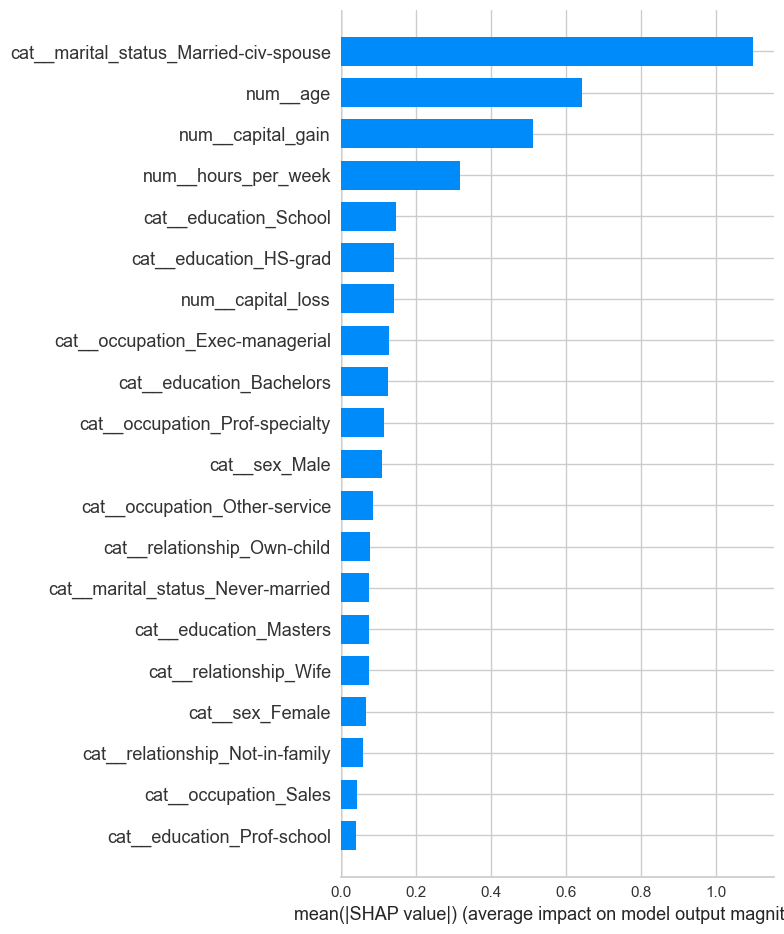


Résumé des effets SHAP


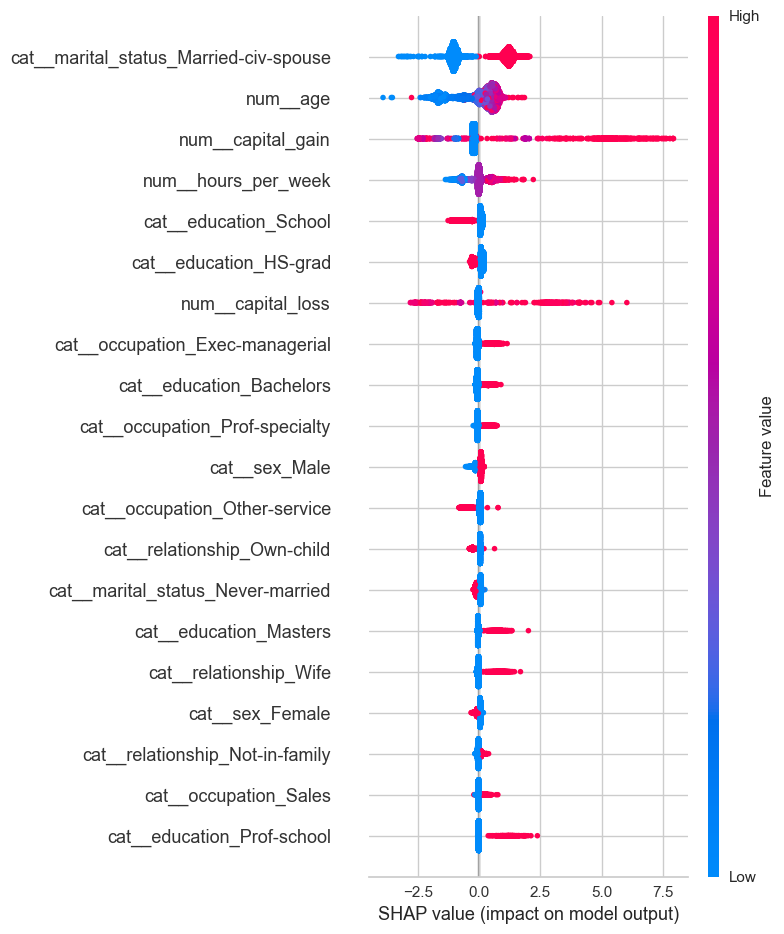


Force plot pour l'observation 0


In [181]:
import shap
import matplotlib.pyplot as plt
from IPython.display import display

# Initialisation nécessaire pour les visualisations JavaScript
shap.initjs()

# 1. Vérification et préparation des données
if hasattr(X_test_preprocessed, "toarray"):
    X_test_shap = X_test_preprocessed.toarray()
else:
    X_test_shap = np.array(X_test_preprocessed, dtype=np.float32)

# 2. Création de l'explainer SHAP
explainer = shap.TreeExplainer(best_model)

# 3. Calcul des valeurs SHAP
shap_values = explainer.shap_values(X_test_shap)

# Pour RandomForest: prendre les valeurs pour la classe positive (1)
if isinstance(shap_values, list):
    shap_values = shap_values[1]

# 4. Visualisation globale
print("Importance globale des caractéristiques")
shap.summary_plot(shap_values, X_test_shap, 
                 feature_names=preprocessor.get_feature_names_out(),
                 plot_type="bar", show=False)
plt.tight_layout()
plt.show()

# 5. Visualisation des effets
print("\nRésumé des effets SHAP")
shap.summary_plot(shap_values, X_test_shap,
                 feature_names=preprocessor.get_feature_names_out(),
                 show=False)
plt.tight_layout()
plt.show()

# 6. Visualisation force_plot pour une observation spécifique
observation_idx = 0  # Vous pouvez changer cet index
print(f"\nForce plot pour l'observation {observation_idx}")

# Version HTML qui fonctionne dans tous les environnements
force_plot_html = shap.force_plot(explainer.expected_value[1] if isinstance(explainer.expected_value, list) else explainer.expected_value,
                                shap_values[observation_idx],
                                X_test_shap[observation_idx],
                                feature_names=preprocessor.get_feature_names_out(),
                                matplotlib=False)

# Affichage dans le notebook
display(force_plot_html)

# Sauvegarde en fichier HTML si besoin
with open('shap_force_plot.html', 'w') as f:
    f.write(force_plot_html.html())

##  sauvegarde du modèle

In [ ]:

# Sauvegarde du modèle et du preprocessor
model_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', best_model)
])

with open('best_model.dill', 'wb') as f:
    dill.dump(model_pipeline, f)

print("Modèle sauvegardé avec succès.")

Modèle sauvegardé avec succès.
